In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [ ]:
list_data = os.listdir('./Data_ecommerce')
list_data

['olist_customers_dataset.csv',
 'olist_geolocation_dataset.csv',
 'olist_orders_dataset.csv',
 'olist_order_items_dataset.csv',
 'olist_order_payments_dataset.csv',
 'olist_order_reviews_dataset.csv',
 'olist_products_dataset.csv',
 'olist_sellers_dataset.csv',
 'product_category_name_translation.csv']

In [ ]:
df=[]
for i in list_data:
    d=pd.read_csv('./Data_ecommerce/'+i)
    df.append(d)

In [ ]:
customers_df = df[0]
geolocate_df = df[1]
orders_df = df[2]
items_df = df[3]
payments_df = df[4]
reviews_df = df[5]
products_df = df[6]
sellers_df=df[7]
categories_df=df[8]

# Feature engineerign

In [ ]:
item_product = pd.merge(items_df,products_df,on='product_id',how='left')

In [ ]:
item_product_reviews = pd.merge(item_product,reviews_df,on='order_id',how='left')

In [ ]:
item_product_reviews_orders = pd.merge(item_product_reviews,orders_df,on='order_id',how='left')

In [ ]:
item_product_reviews_orders.shape

(113322, 28)

In [ ]:
item_product_reviews_orders_location = pd.merge(item_product_reviews_orders,customers_df,on='customer_id')

item_product_reviews_orders_location_payment = pd.merge(item_product_reviews_orders_location,payments_df,on='order_id')

Data = item_product_reviews_orders_location_payment

In [ ]:
Data = pd.merge(Data,categories_df,on='product_category_name',how='left')
Data.drop(columns=['product_category_name'],inplace=True)
Data.rename(columns={'product_category_name_english':'product_category_name'},inplace=True)

In [ ]:
Data.head(3)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,product_photos_qty,...,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_sequential,payment_type,payment_installments,payment_value,product_category_name
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,58.0,598.0,4.0,...,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,1,credit_card,2,72.19,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93,56.0,239.0,2.0,...,2017-05-15 00:00:00,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,1,credit_card,3,259.83,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.0,17.87,59.0,695.0,2.0,...,2018-02-05 00:00:00,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,1,credit_card,5,216.87,furniture_decor


In [ ]:
Data.isna().sum()

order_id                              0
order_item_id                         0
product_id                            0
seller_id                             0
shipping_limit_date                   0
price                                 0
freight_value                         0
product_name_lenght                1709
product_description_lenght         1709
product_photos_qty                 1709
product_weight_g                     20
product_length_cm                    20
product_height_cm                    20
product_width_cm                     20
review_id                             0
review_score                          0
review_comment_title             104226
review_comment_message            67650
review_creation_date                  0
review_answer_timestamp               0
customer_id                           0
order_status                          0
order_purchase_timestamp              0
order_approved_at                    15
order_delivered_carrier_date       1254


In [ ]:
df =    Data[['order_id','order_purchase_timestamp','product_category_name','price','freight_value','payment_value',
        'product_name_lenght','product_description_lenght',
        'product_photos_qty', 'product_weight_g',
        'product_length_cm','product_height_cm',
        'product_width_cm','review_score',
        'order_status','payment_type','customer_state','customer_city']]
df.head(5)                                

,order_id,order_purchase_timestamp,product_category_name,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,order_status,payment_type,customer_state,customer_city
0,00010242fe8c5a6d1ba2dd792cb16214,2017-09-13 08:59:02,cool_stuff,58.90,13.29,72.19,58.0,598.0,4.0,650.0,28.0,9.0,14.0,5,delivered,credit_card,RJ,campos dos goytacazes
1,00018f77f2f0320c557190d7a144bdd3,2017-04-26 10:53:06,pet_shop,239.90,19.93,259.83,56.0,239.0,2.0,30000.0,50.0,30.0,40.0,4,delivered,credit_card,SP,santa fe do sul
2,000229ec398224ef6ca0657da4fc703e,2018-01-14 14:33:31,furniture_decor,199.00,17.87,216.87,59.0,695.0,2.0,3050.0,33.0,13.0,33.0,5,delivered,credit_card,MG,para de minas
3,00024acbcdf0a6daa1e931b038114c75,2018-08-08 10:00:35,perfumery,12.99,12.79,25.78,42.0,480.0,1.0,200.0,16.0,10.0,15.0,4,delivered,credit_card,SP,atibaia
4,00042b26cf59d7ce69dfabb4e55b4fd9,2017-02-04 13:57:51,garden_tools,199.90,18.14,218.04,59.0,409.0,1.0,3750.0,35.0,40.0,30.0,5,delivered,credit_card,SP,varzea paulista


In [ ]:
df.isna().mean() # Como el porcentage de valores nulos es pequeño decido eliminarlo

order_id                      0.000000
order_purchase_timestamp      0.000000
product_category_name         0.014656
price                         0.000000
freight_value                 0.000000
payment_value                 0.000000
product_name_lenght           0.014444
product_description_lenght    0.014444
product_photos_qty            0.014444
product_weight_g              0.000169
product_length_cm             0.000169
product_height_cm             0.000169
product_width_cm              0.000169
review_score                  0.000000
order_status                  0.000000
payment_type                  0.000000
customer_state                0.000000
customer_city                 0.000000
dtype: float64

In [ ]:
df['order_purchase_timestamp'] = pd.to_datetime(df.iloc[:,1])

<ipython-input-58-eaa2c7b4bac9>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
df=df.dropna()

In [ ]:
df.head()

,order_id,order_purchase_timestamp,product_category_name,price,freight_value,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,review_score,order_status,payment_type,customer_state,customer_city
0,00010242fe8c5a6d1ba2dd792cb16214,2017-09-13 08:59:02,cool_stuff,58.90,13.29,72.19,58.0,598.0,4.0,650.0,28.0,9.0,14.0,5,delivered,credit_card,RJ,campos dos goytacazes
1,00018f77f2f0320c557190d7a144bdd3,2017-04-26 10:53:06,pet_shop,239.90,19.93,259.83,56.0,239.0,2.0,30000.0,50.0,30.0,40.0,4,delivered,credit_card,SP,santa fe do sul
2,000229ec398224ef6ca0657da4fc703e,2018-01-14 14:33:31,furniture_decor,199.00,17.87,216.87,59.0,695.0,2.0,3050.0,33.0,13.0,33.0,5,delivered,credit_card,MG,para de minas
3,00024acbcdf0a6daa1e931b038114c75,2018-08-08 10:00:35,perfumery,12.99,12.79,25.78,42.0,480.0,1.0,200.0,16.0,10.0,15.0,4,delivered,credit_card,SP,atibaia
4,00042b26cf59d7ce69dfabb4e55b4fd9,2017-02-04 13:57:51,garden_tools,199.90,18.14,218.04,59.0,409.0,1.0,3750.0,35.0,40.0,30.0,5,delivered,credit_card,SP,varzea paulista


In [ ]:
df.shape

(116580, 18)

In [ ]:
dummies = pd.get_dummies(df[['order_status','payment_type','customer_state','customer_city','product_category_name']],drop_first=True)

df = pd.concat([df,dummies],axis=1).drop(columns=['order_status','payment_type','customer_state','customer_city','product_category_name'])

In [ ]:
df.shape

(116580, 4212)

# Principal Component Analysis

In [ ]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler()
data_scaler = scaler.fit_transform(df.iloc[:,2:])
data_scaler.shape

(116580, 4210)

In [ ]:
from sklearn.decomposition import PCA

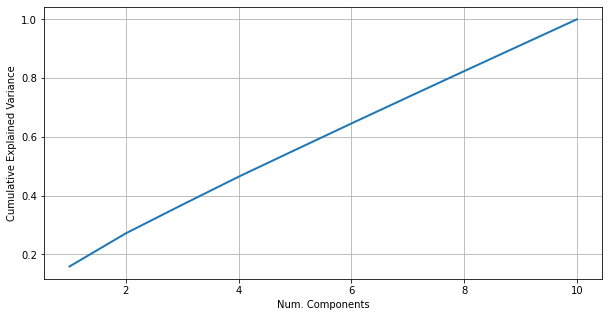

In [ ]:
# Cuál es el numero de pca adecuado
pca = PCA()

sample_data = data_scaler.copy()

pca.n_components = 10

pca_data = pca.fit_transform(sample_data)

percentage_var_explained = pca.explained_variance_ / np.sum(pca.explained_variance_)

cum_var_explained = np.cumsum(percentage_var_explained)

plt.figure(1, figsize=(10, 5))
plt.plot(np.arange(1,11), cum_var_explained, linewidth=2)
plt.grid()
plt.xlabel('Num. Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [ ]:
# El numero de conmponentes adecuado es 8 y que explica el 80 porciento de la varianza de los datos

In [ ]:
from statsmodels.multivariate.pca import PCA
pca.n_components = 8

pca_data = pca.fit_transform(sample_data)

In [ ]:
pca_data.shape

(116580, 8)

In [ ]:
df_pca = pd.DataFrame(data=pca_data, 
                      columns=['pc_1','pc_2','pc_3','pc_4','pc_5','pc_6','pc_7','pc_8'])

In [ ]:
pca.components_.shape

(8, 4210)

In [ ]:
pca_data.shape

(116580, 8)

# K-means

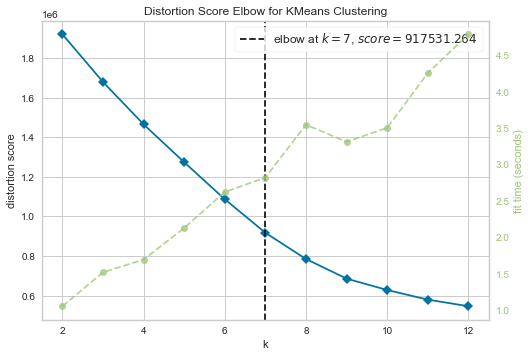

In [ ]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from yellowbrick.cluster import KElbowVisualizer

X = pca_data

model = KMeans()
visualizer = KElbowVisualizer(model,metric='distortion', k=(2,13))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()

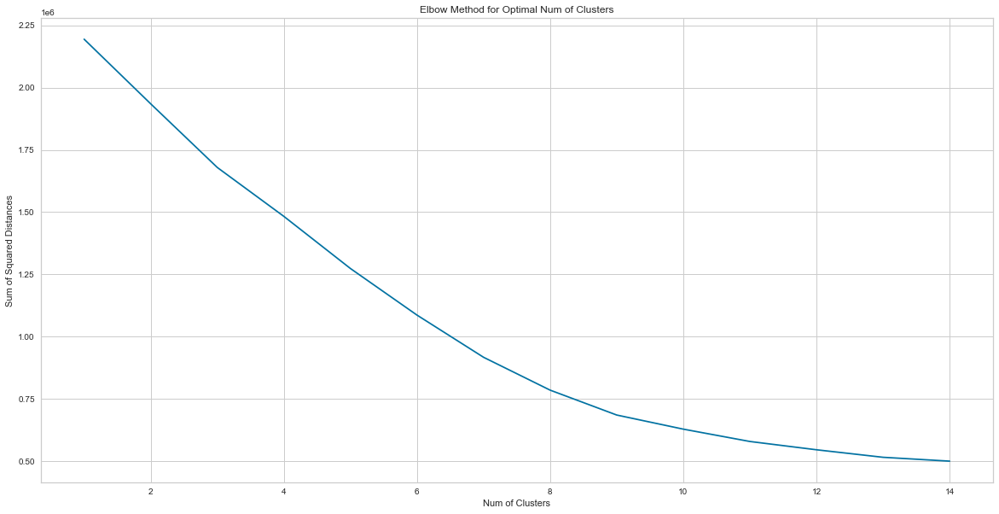

In [ ]:
sum_of_squared_distances = []

clusters = range(1, 15)

for num_clusters in clusters:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans = kmeans.fit(X)
    sum_of_squared_distances.append(kmeans.inertia_)

plt.figure(figsize=(20, 10))
plt.plot(clusters, sum_of_squared_distances, 'bx-')
plt.xlabel('Num of Clusters')
plt.ylabel('Sum of Squared Distances')
plt.title('Elbow Method for Optimal Num of Clusters')
plt.show()

# Implementación del modelo K-means



In [ ]:
# Numero de cluster o segmentos = 7
from sklearn.cluster import KMeans
model = KMeans(n_clusters=7, random_state=42)
model.fit(X)

KMeans(n_clusters=7, random_state=42)

In [ ]:
clusters = model.labels_
clusters.shape

(116580,)

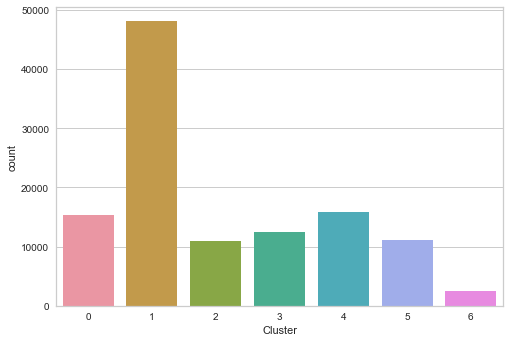

In [ ]:
sns.countplot(clusters)
plt.xlabel('Cluster')
plt.show()

In [ ]:
df_pca['cluster'] = clusters

In [ ]:
import plotly.graph_objs as go 

escena = dict(xaxis=dict(title='pc_1'), yaxis=dict(title='pc_2'), 
              zaxis=dict(title='pc_3'))

labels = model.labels_

puntos = go.Scatter3d(x=df_pca.iloc[:,0], y=df_pca.iloc[:,1],
                      z=df_pca.iloc[:,2], mode='markers', 
                      marker=dict(color=labels, colorscale='rainbow',
                                  size=5, line=dict(color='honeydew', width=5) 
                                  ))

layout = go.Layout(margin=dict(l=0, r=0), scene=escena, height=1000, width=1000)
dots = puntos

fig = go.Figure(data=dots, layout=layout)
fig.show()

In [ ]:
df.shape[0]==len(clusters)

True

In [ ]:
df['cluster']=clusters

In [ ]:
data_labeled = pd.merge(df[['order_id','cluster']],Data,on='order_id',how='left')
data_labeled.head()

,order_id,cluster,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,...,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_sequential,payment_type,payment_installments,payment_value,product_category_name
0,00010242fe8c5a6d1ba2dd792cb16214,0,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,58.0,598.0,...,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,1,credit_card,2,72.19,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,56.0,239.0,...,2017-05-15 00:00:00,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,1,credit_card,3,259.83,pet_shop
2,000229ec398224ef6ca0657da4fc703e,4,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,59.0,695.0,...,2018-02-05 00:00:00,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,1,credit_card,5,216.87,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,42.0,480.0,...,2018-08-20 00:00:00,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,1,credit_card,2,25.78,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,59.0,409.0,...,2017-03-17 00:00:00,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,1,credit_card,3,218.04,garden_tools


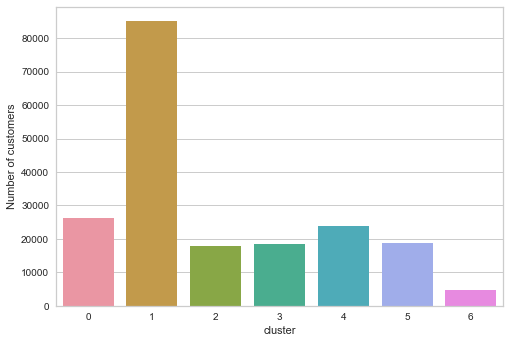

In [ ]:
customerBycluster = data_labeled.groupby('cluster',as_index=False)['customer_unique_id'].count()

sns.barplot(x=customerBycluster.iloc[:,0],y=customerBycluster.iloc[:,1])
plt.ylabel('Number of customers')
plt.show()

In [ ]:
data_labeled.g

,order_id,cluster,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,...,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_sequential,payment_type,payment_installments,payment_value,product_category_name
1,00018f77f2f0320c557190d7a144bdd3,1,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,56.0,239.0,...,2017-05-15 00:00:00,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,1,credit_card,3,259.83,pet_shop
3,00024acbcdf0a6daa1e931b038114c75,1,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,42.0,480.0,...,2018-08-20 00:00:00,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,1,credit_card,2,25.78,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,59.0,409.0,...,2017-03-17 00:00:00,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,1,credit_card,3,218.04,garden_tools
6,00054e8431b9d7675808bcb819fb4a32,1,1,8d4f2bb7e93e6710a28f34fa83ee7d28,7040e82f899a04d1b434b795a43b4617,2017-12-14 12:10:31,19.90,11.85,52.0,815.0,...,2018-01-04 00:00:00,635d9ac1680f03288e72ada3a1035803,16700,guararapes,SP,1,credit_card,1,31.75,telephony
8,0005a1a1728c9d785b8e2b08b904576c,1,1,310ae3c140ff94b03219ad0adc3c778f,a416b6a846a11724393025641d4edd5e,2018-03-26 18:31:29,145.95,11.65,59.0,493.0,...,2018-03-29 00:00:00,639d23421f5517f69d0c3d6e6564cf0e,11075,santos,SP,1,credit_card,3,157.60,health_beauty
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194790,fff90cdcb3b2e6cfb397d05d562fd3fe,1,1,764292b2b0f73f77a0272be03fdd45f3,bd23da7354813347129d751591d1a6e2,2017-11-30 10:11:28,89.90,11.83,56.0,701.0,...,2017-12-08 00:00:00,0e1dad535a5b2359a2ff0a7d475ffb86,4119,sao paulo,SP,1,credit_card,1,101.73,furniture_decor
194792,fffb0b1a50e65c449020434fa835e078,1,1,e7be84ea9462aac5e2b0b08eb35ba7f1,36a968b544695394e4e9d7572688598f,2017-04-28 16:45:12,4.90,10.96,41.0,103.0,...,2017-05-15 00:00:00,b2d2b4204f7fc4b4aeca38e3cd680a7e,13083,campinas,SP,1,credit_card,1,15.86,musical_instruments
194813,fffce4705a9662cd70adb13d4a31832d,1,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,43.0,869.0,...,2017-11-10 00:00:00,cd79b407828f02fdbba457111c38e4c4,4039,sao paulo,SP,1,credit_card,3,116.85,sports_leisure
194814,fffe18544ffabc95dfada21779c9644f,1,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,56.0,1306.0,...,2017-08-25 00:00:00,eb803377c9315b564bdedad672039306,13289,vinhedo,SP,1,credit_card,3,64.71,computers_accessories


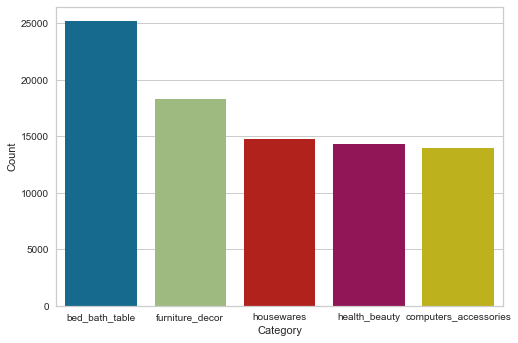

In [ ]:
# Top 5 de categorias
top_5 = pd.DataFrame(data_labeled['product_category_name'].value_counts()[:5]).reset_index().rename(columns={'index':'Category','product_category_name':'Count'})
sns.barplot(data=top_5,x='Category',y='Count')

In [ ]:
# Numero de clientes por estado
customers_state = data_labeled.groupby('customer_state',as_index=False)['customer_unique_id'].count()
customers_state.rename(columns={'customer_state':'State','customer_unique_id':'Customers'},inplace=True)

In [ ]:
customers_st = customers_state.sort_values(by='Customers',ascending=False)[:5]

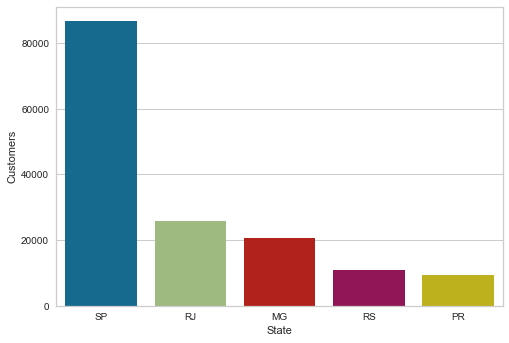

In [ ]:
sns.barplot(data=customers_st,x='State',y='Customers')

In [ ]:
def category_segmentation(cluster):
    
    data = data_labeled[data_labeled['cluster']==cluster]
    top_5 = pd.DataFrame(data['product_category_name'].value_counts()[:5]).reset_index().rename(columns={'index':'Category','product_category_name':'Count'})
    
    customers_state = data.groupby('customer_state',as_index=False)['customer_unique_id'].count()
    customers_state.rename(columns={'customer_state':'State','customer_unique_id':'Customers'},inplace=True)
    customers_st = customers_state.sort_values(by='Customers',ascending=False)[:5]
    
   
    plt.figure(figsize=(17,6))
    plt.subplot(1,2,1)
    plt.title(f'Cluster:{cluster}')
    sns.barplot(data=top_5,x='Category',y='Count',palette="bright") 
    
    plt.subplot(1,2,2)
    plt.title(f'Cluster:{cluster}')
    sns.barplot(data=customers_st,x='State',y='Customers')
    
    plt.show()

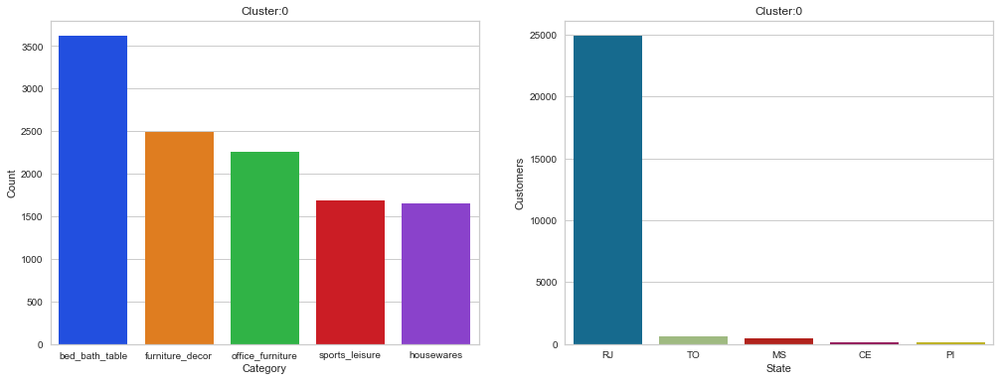

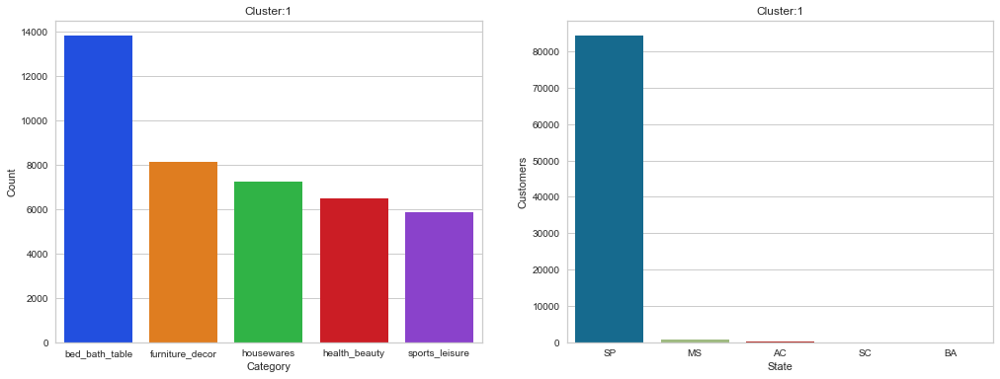

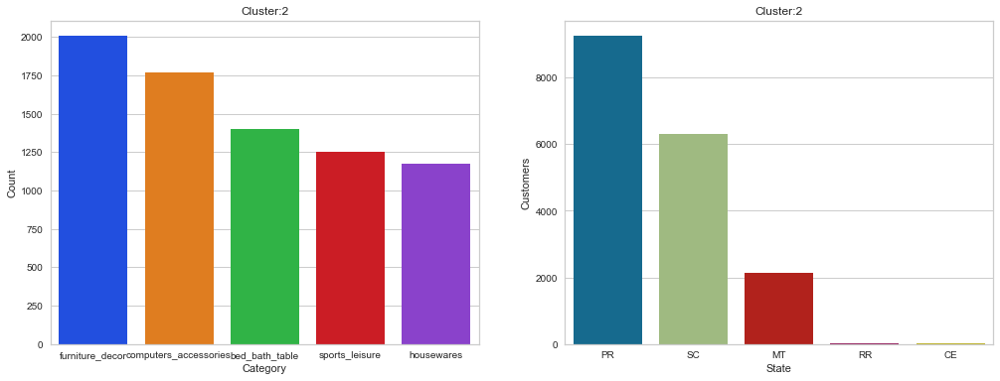

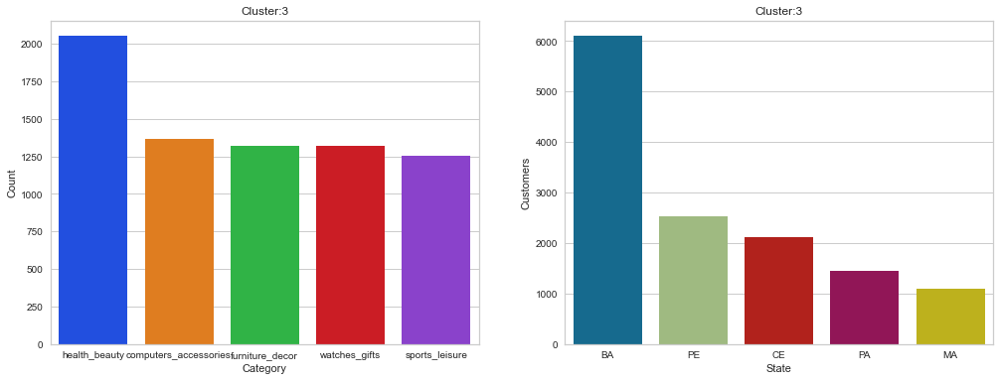

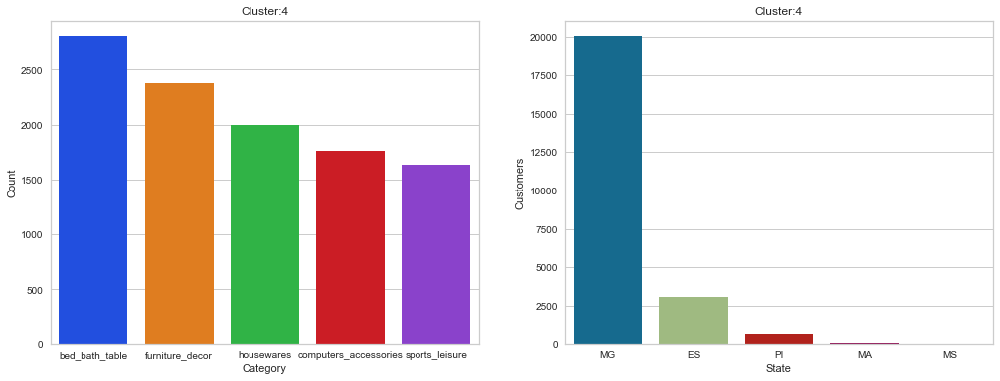

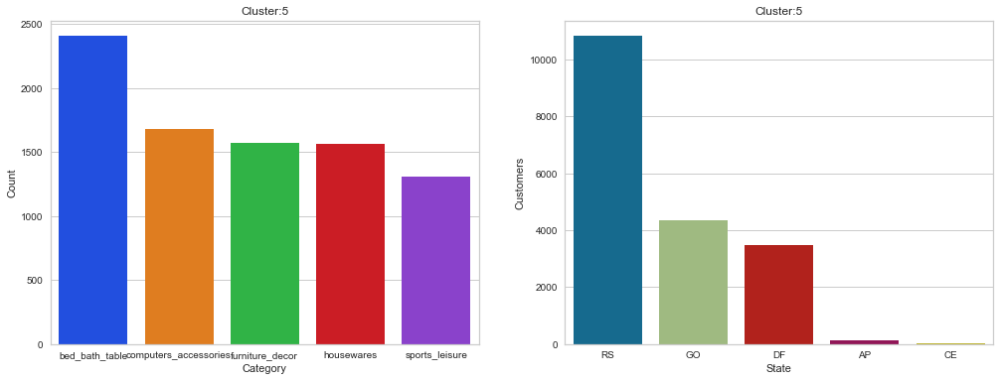

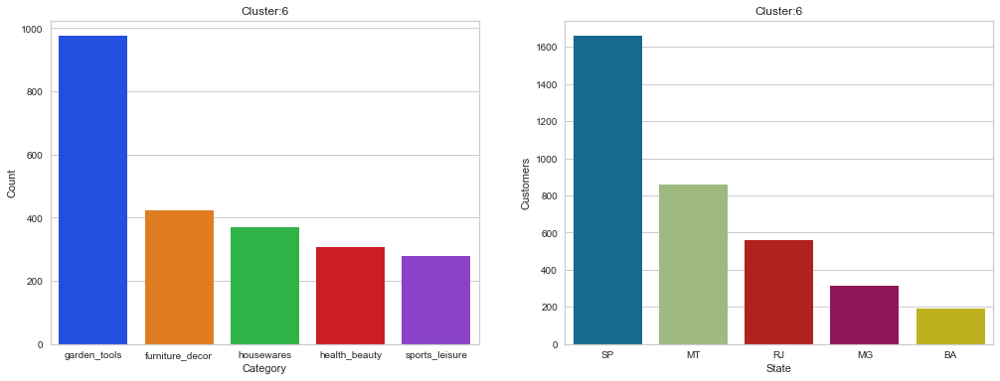

In [ ]:
for i in range(0,7):
    category_segmentation(i)

In [ ]:
len(data_labeled['customer_unique_id'].unique())

94086

In [ ]:
def cluster_segmentation(cluster):
    
    data = data_labeled[data_labeled['cluster']==cluster]
    total_orders = data_labeled.order_id.count()
    total_customers = len(data_labeled.customer_unique_id)
    
    category_orders=data.groupby('product_category_name',as_index=False)['order_id'].count().rename(columns={'product_category_name':'Category','order_id':'Orders'})
    total = category_orders['Orders'].sum()
    category_orders['Orders'] = (category_orders['Orders']/total_orders) * 100
    top_5 = category_orders.sort_values(by='Orders',ascending=False)[:5]
 
   
    
    customers_state = data.groupby('customer_city',as_index=False)['customer_unique_id'].count()
    customers_state.rename(columns={'customer_city':'City','customer_unique_id':'Customers'},inplace=True)
    total = customers_state['Customers'].sum()
    customers_state['Customers']=(customers_state['Customers']/total_customers)*100
    customers_st = customers_state.sort_values(by='Customers',ascending=False)[:5]
    
    
    plt.figure(figsize=(17,6))
    plt.subplot(1,2,1)
    plt.title(f'Cluster:{cluster}')
    sns.barplot(data=top_5,x='Category',y='Orders')
    plt.ylabel('% Orders')
    
    plt.subplot(1,2,2)
    plt.title(f'Cluster:{cluster}')
    sns.barplot(data=customers_st,x='City',y='Customers')
    plt.ylabel('% Customers')
    
    plt.show()

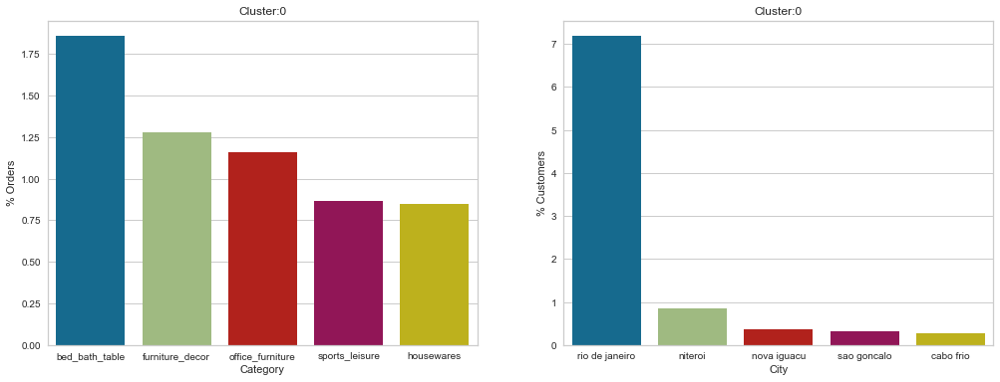

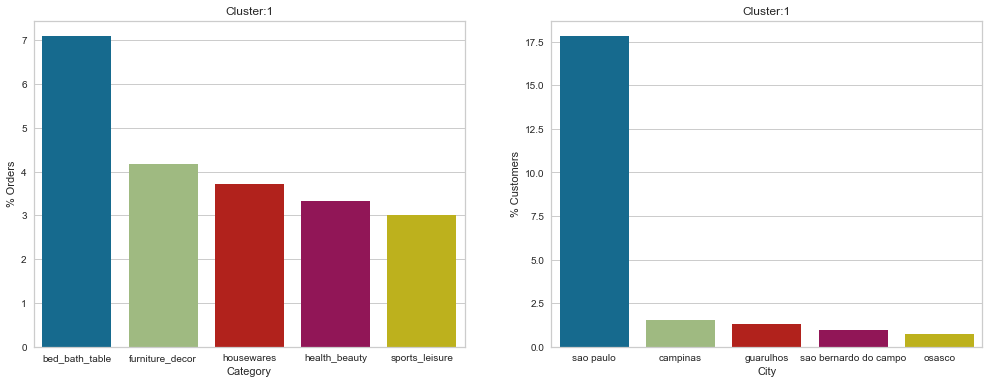

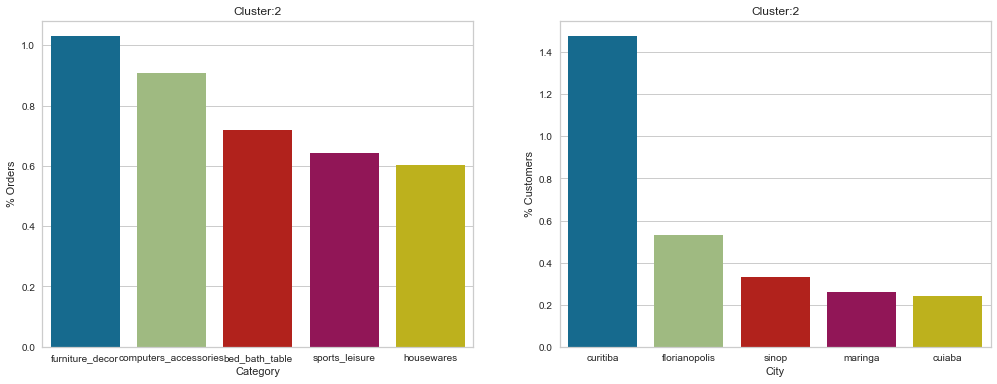

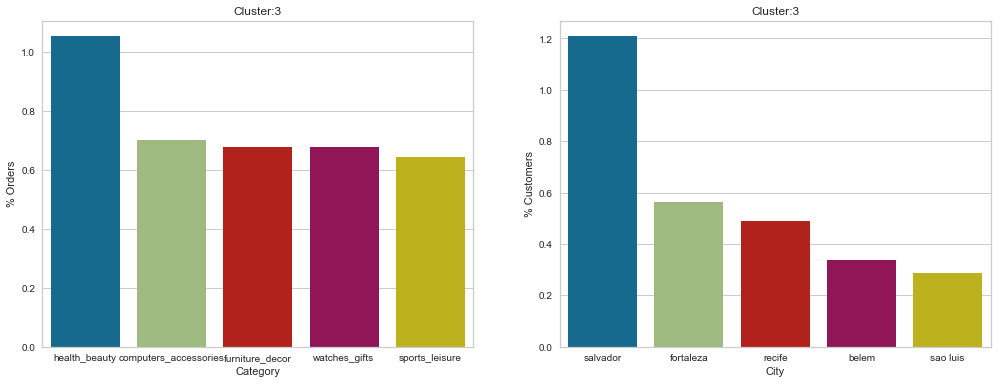

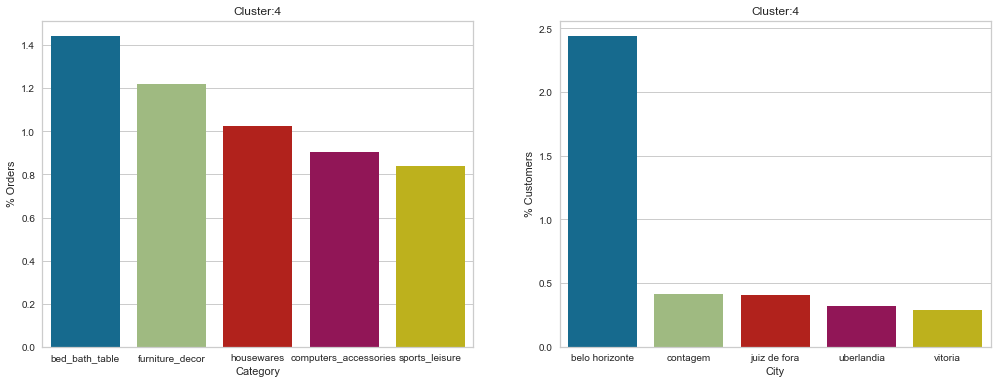

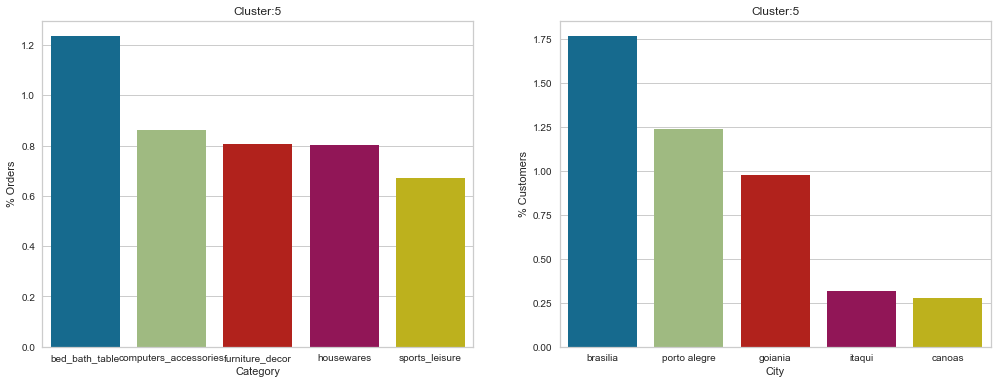

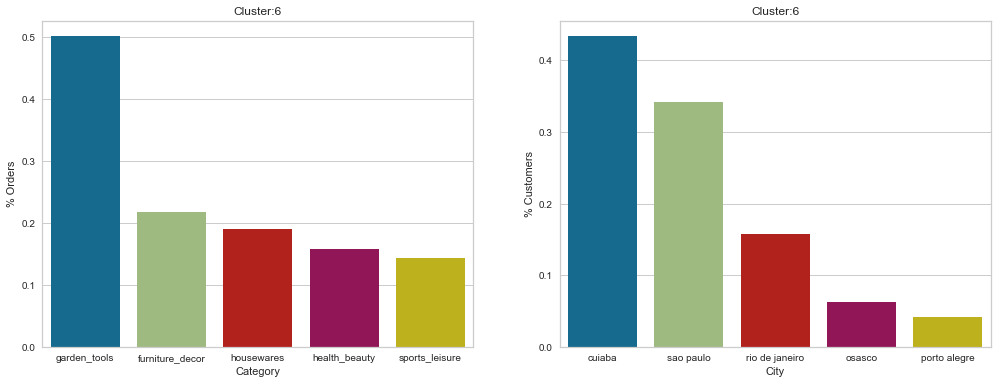

In [ ]:
for i in range(0,7):
    cluster_segmentation(i)

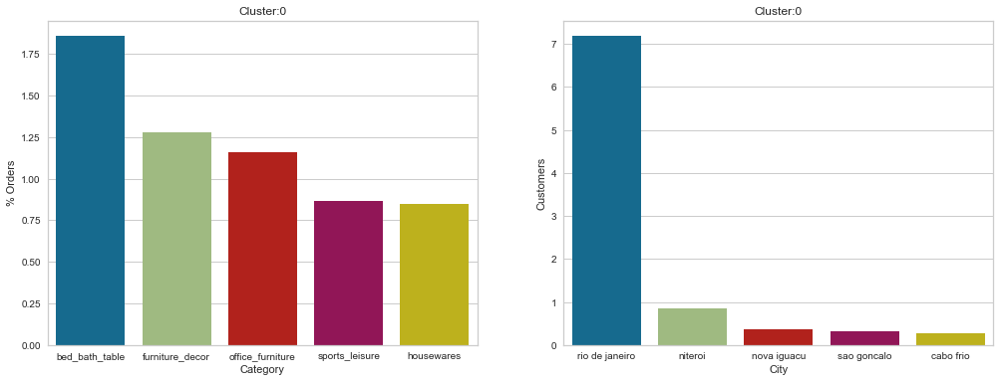

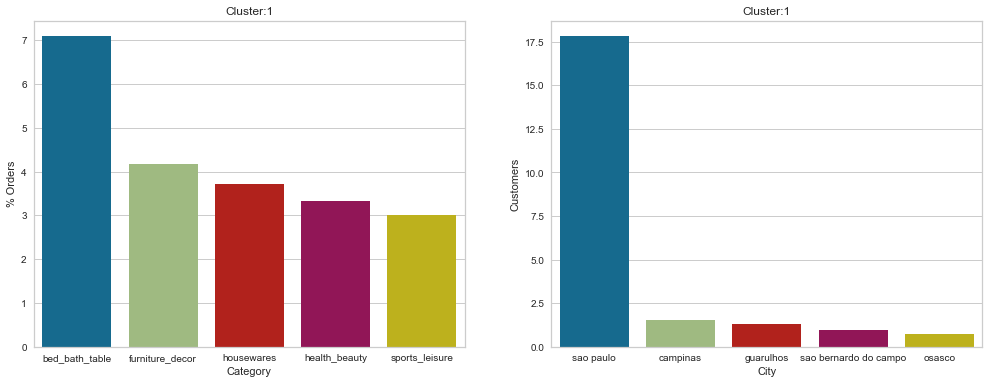

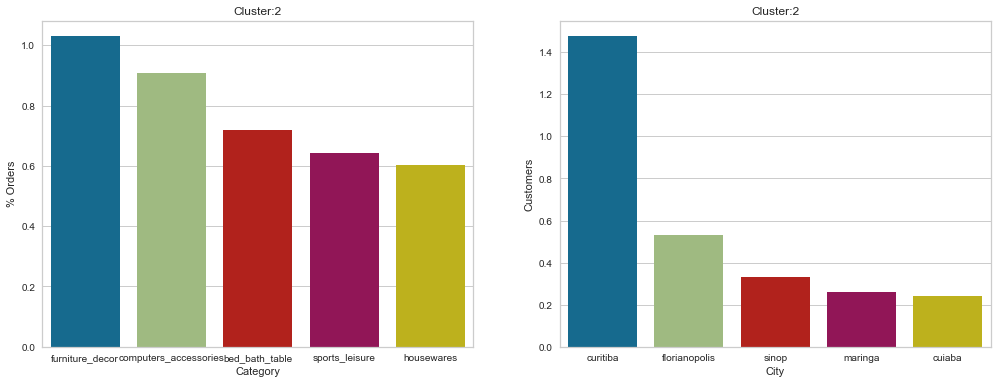

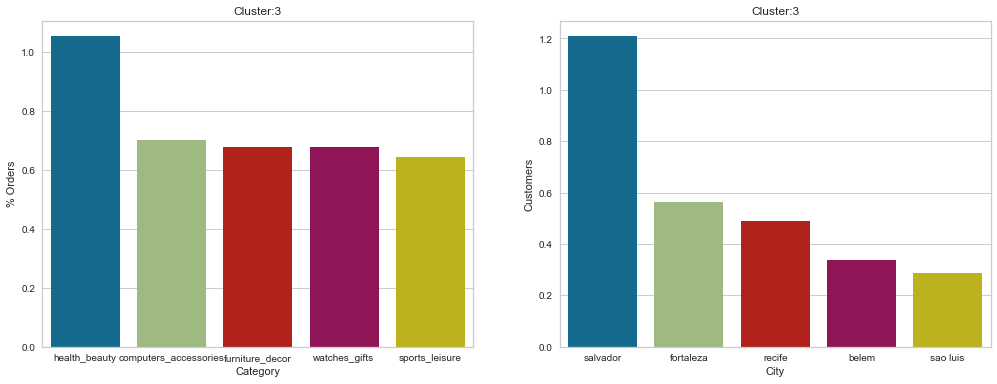

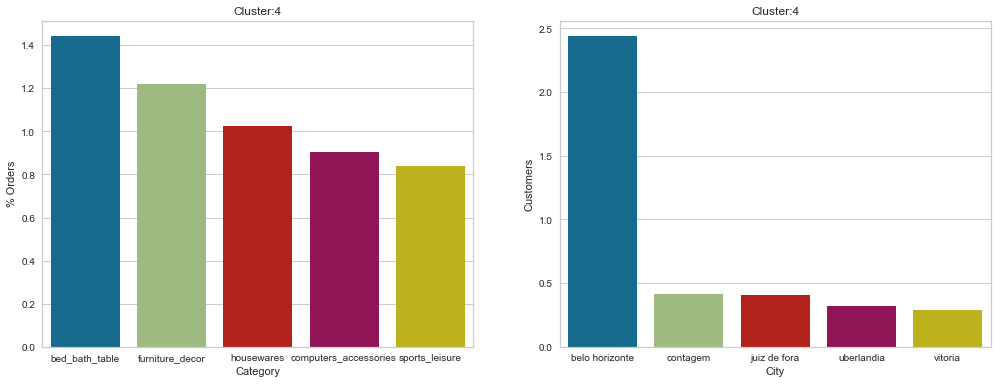

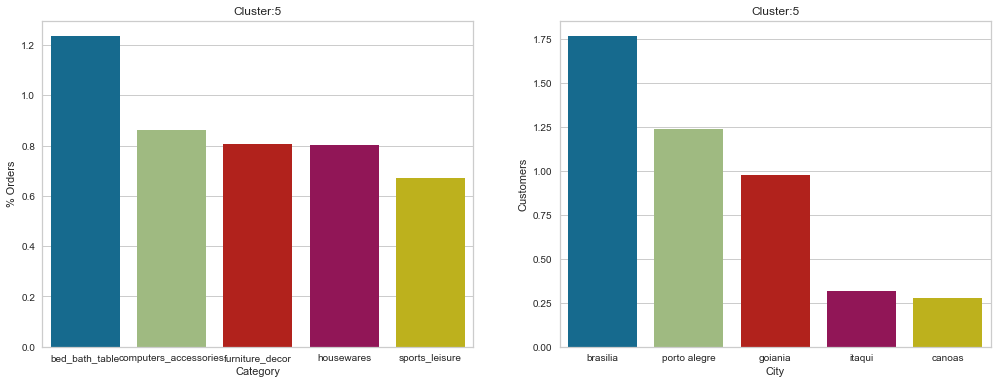

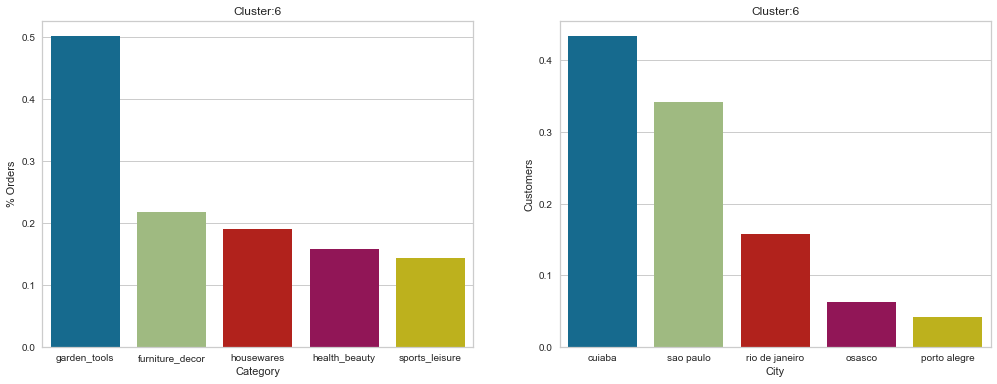

In [ ]:
for i in range(0,7):
    cluster_segmentation(i)

In [ ]:
# cuantas categorias existe
print('Categorias: ',len(data_labeled['product_category_name'].unique()))
print('Cities: ',len(data_labeled['customer_city'].unique()))
#print('Customers: ',len(data_labeled['customer_unique_id'])
print('Orders: ',data_labeled['order_id'].count())

Categorias:  72
Cities:  4095
Orders:  194816


In [ ]:
print('Orders: ',len(data_labeled['order_id']))

Orders:  194816


In [ ]:
data_labeled

,order_id,cluster,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_name_lenght,product_description_lenght,...,order_estimated_delivery_date,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,payment_sequential,payment_type,payment_installments,payment_value,product_category_name
0,00010242fe8c5a6d1ba2dd792cb16214,0,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,58.0,598.0,...,2017-09-29 00:00:00,871766c5855e863f6eccc05f988b23cb,28013,campos dos goytacazes,RJ,1,credit_card,2,72.19,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,56.0,239.0,...,2017-05-15 00:00:00,eb28e67c4c0b83846050ddfb8a35d051,15775,santa fe do sul,SP,1,credit_card,3,259.83,pet_shop
2,000229ec398224ef6ca0657da4fc703e,4,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,59.0,695.0,...,2018-02-05 00:00:00,3818d81c6709e39d06b2738a8d3a2474,35661,para de minas,MG,1,credit_card,5,216.87,furniture_decor
3,00024acbcdf0a6daa1e931b038114c75,1,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,42.0,480.0,...,2018-08-20 00:00:00,af861d436cfc08b2c2ddefd0ba074622,12952,atibaia,SP,1,credit_card,2,25.78,perfumery
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,59.0,409.0,...,2017-03-17 00:00:00,64b576fb70d441e8f1b2d7d446e483c5,13226,varzea paulista,SP,1,credit_card,3,218.04,garden_tools
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
194811,fffc94f6ce00a00581880bf54a75a037,3,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41,43.0,1002.0,...,2018-05-18 00:00:00,0c9aeda10a71f369396d0c04dce13a64,65077,sao luis,MA,1,boleto,1,343.40,housewares
194812,fffcd46ef2263f404302a634eb57f7eb,2,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53,31.0,232.0,...,2018-08-01 00:00:00,0da9fe112eae0c74d3ba1fe16de0988b,81690,curitiba,PR,1,boleto,1,386.53,computers_accessories
194813,fffce4705a9662cd70adb13d4a31832d,1,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95,43.0,869.0,...,2017-11-10 00:00:00,cd79b407828f02fdbba457111c38e4c4,4039,sao paulo,SP,1,credit_card,3,116.85,sports_leisure
194814,fffe18544ffabc95dfada21779c9644f,1,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72,56.0,1306.0,...,2017-08-25 00:00:00,eb803377c9315b564bdedad672039306,13289,vinhedo,SP,1,credit_card,3,64.71,computers_accessories


###  Conclusiones:

Una vez implementado el modelo obtenemos etiquetas de clientes y órdenes con características similares, esto nos permitirá junto al área de ventas y mercadotecnia, elaborar mejores estrategias por clientes u órdenes que tengan características similares. Por ejemplo en las últimas gráficas podemos comparar la cantidad de órdenes por categorías y que ciudades o estados tienen una mayor cantidad de clientes; tener estas segmentación de clientes o etiquetas en nuestros datos nos permiten desarrollar un análisis con mayor profundidad enfocándonos en sectores de la ciudad, categorias de producto, donde reside el cliente, esto nos permitirá crear mejores estrategias de marketing para grupos específicos de clientes, crear anuncios dirigidos, mejores recomendaciones, mejor ajuste de la distribución de productos y diversas propuestas que puedan surgir en área de ventas y mercadotecnia.
 